# Projection Agent

In [1]:
import os, datetime
import numpy as np
import matplotlib.pyplot as plt
import joblib
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.text import Tokenizer,text_to_word_sequence

## Collect HTML files

Load the HTML files

In [2]:
files = []

for f in os.listdir(os.path.join(os.getcwd(),'html')):
    fd = open(os.path.join(os.getcwd(),'html',f),'r')
    content = fd.read()
    files.append(content)
    fd.close()

Add a mock file as a concatentation of a previous one

In [3]:
files.append(files[0]*10)

## Preprocess the files

Define the padding and trimming parameters

In [4]:
padding='post'

maxlen=200
truncating='post'

Load the tokenizer

Show an example of tokenization

In [5]:
SQLi_tokenizer = joblib.load('ignore_tokenizer_20210318105336141483')

Convert the pages into token sequences:

In [6]:
tokens_list = SQLi_tokenizer.texts_to_sequences(files)

Pad and trim the sequences to fit them into an array:

In [7]:
tokens_array = keras.preprocessing.sequence.pad_sequences(tokens_list, padding=padding, maxlen=maxlen, truncating=truncating)

## Define a mock server

We generate the actions for our server.

In [8]:
from generate_actions import generate_actions
actions = generate_actions()

We import and instantiate a new server.

In [9]:
import SQLiServer_2 as SQLiServer
env = SQLiServer.mockSQLenv(actions,files)

Game setup with a random query


## Running an agent

In [10]:
n_episodes = 2000

In [11]:
import ProjectionAgent_1 as ProjectionAgent

In [12]:
agent = ProjectionAgent.Agent(SQLi_tokenizer,actions)
agent.set_learning_options()
agent.set_padding_options()

In [13]:
steps = []
rewards = []

for _ in range(n_episodes):
    
    env = SQLiServer.mockSQLenv(actions,files)
    agent.reset(env)
    
    agent.run_episode()
    steps.append(agent.steps)
    rewards.append(agent.rewards)

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I r

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 5: " union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1


Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I ret

Server response is -1
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union sele

Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wron

Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset

Server response is 0
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2

Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 10: " union select 1,2,

Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 5: " union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: 

Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with 

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3:

I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I re

Server response is 1
I received action 6: " union select 1,2,3#
Query with correct number of rows
Server response is 4
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' u

I received action 44:  union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 44:  union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 44:  union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the 

Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wr

Server response is 2
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flag

Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Q

I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query with correct number of rows
Server response is 4
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable lim

Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: 

Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Correct exploratory action for the escape. I return 1

Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,fl

Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
Game setup with a random query
Game reset (but not reinitialized with a new random

Server response is 0
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 25: ' union select 1,2,3,4#
Query with correct number of rows
Server response is 4
I received action 49:  union select flag,flag,flag,flag from F

Server response is 0
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 34:  and 1=1#
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 40:  union select 1,2,3#
Query with correct number of rows
Server response is 4
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
S

Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select 

Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#

Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically 

I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 

Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntacti

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 2: " union select 1#
Query with correct number of rows
Server response is 4
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I 

Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 19: ' union select 1#
Query with correct number of rows
Server response is 4
I received action 40:  union select 1,2,3#
Q

Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2

Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Quer

Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50: 

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I receive

Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 50:  union select

Server response is 0
I received action 8: " union select 1,2,3,4#
Query with correct number of rows
Server response is 4
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntact

Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number 

Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select

Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable li

Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the c

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wr

Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 47:  union select flag,flag from Flagtable l

Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I receive

Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
S

Server response is 0
I received action 44:  union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 

Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' u

I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Serv

Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union selec

Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query with correct number of rows
Server response is 4
I received actio

Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#


Server response is 4
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically w

Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 

Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server r

Server response is 0
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,fl

Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I receive

Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " un

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union 

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " unio

Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I rece

Server response is 1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit

Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 8: " union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Fl

Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response 

Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is

Server response is -1
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 38:  union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 42:  union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received act

Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I receiv

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received act

Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong numbe

Server response is 0
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28:

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' uni

Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 26: ' union select 1,2,3,4 limit 1 off

I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server respons

Server response is 0
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union s

Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30

Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Q

Server response is 1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is s

Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number

Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query is s

Server response is 2
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syn

I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is synta

Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server respon

Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Serv

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the corr

Server response is 0
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Serve

Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server respons

Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server r

Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 18: ' and '1'='2
Query is synta

Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Serv

I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically

Server response is 0
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return 

Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 46:  union sel

Server response is 2
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,f

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  uni

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union s

Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I 

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Serv

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query with correct number of rows
Server response is 4
I received action 48:  u

I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server re

I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit

Server response is -1
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 38:  union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union

I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 2: " union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syn

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game

Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 24: ' union select 1,2,3 limit 1 of

Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union selec

Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received acti

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from

Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 22: ' union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactic

Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Q

I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 42:  union select 1,2,3,4#
Query with correct number of rows
Server response is 4
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query with correct number of rows
Server response is 4
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is

Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Serv

Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I rece

Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Serve

Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 42:  union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union sel

Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received ac

Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  un

Server response is 0
I received action 38:  union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Correct exploratory action for the escape. I ret

Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of r

Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union

Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the cor

Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Ser

Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query with correct number of rows
Server response is 4
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1


Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query with correct number of rows
Server response is 4
I received action 29: ' union select flag from Fla

Server response is 2
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union se

Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Ser

Server response is 0
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select fl

Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received

Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Fl

Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 29: ' 

Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but con

Server response is 1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query with correct number of rows
Server response is 4
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has t

Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I re

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query with correct number of rows
Server response is 4
I received action 17: ' and '1'='1
Query is syntactically wrong. I retur

Server response is 0
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -

I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server res

Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received actio

I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 2: " union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query with correct number of rows
Server response is 4
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically 

Server response is -1
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12:

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 lim

Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntact

Server response is 4
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntacticall

Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Q

Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of 

Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag 

Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 22: ' union s

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 2: " union select 1#
Query with correct number of rows
Server response is 4
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 29: ' union

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query with correct number of rows
S

Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I r

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the corr

Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union s

I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 15: " union select flag,fla

Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Quer

Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query with correct number of rows
Server response is 4
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server 

Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of ro

Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit

Server response is 4
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Serv

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server 

Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server respon

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query

Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I rec

Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 40:  union select 1,2,3#
Query is sy

Server response is 0
I received action 8: " union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limi

I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a ran

Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 6: " union select 1,2,3#
Query with correct number of rows
Server response is 4
I received action 38:  union select 1,2#
Query is syntact

Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I

Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains 

Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong.

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: 

Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 35: 

Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactica

Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query with correct number of rows
Server response is 4
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#


Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, bu

Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactica

Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 16: " union select flag,flag,flag,flag,flag from Fla

Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 23: ' union select 1,2,3#
Query with correct number of rows
Server response is 4
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:

Server response is 4
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select

I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 38:  union select 1,2#
Query with correct number of rows
Server response is 4
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server r

Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 45:  union sele

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server

Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0


Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query has the correct escape, but contains the wro

Server response is 0
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 38:  union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a

Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received act

Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 8: " union se

Server response is 0
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number o

Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has th

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flag

Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I retur

Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 34:  and 1=1#
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0

Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I r

Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I re

Server response is 0
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union

Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 15: " union select flag,flag,flag,f

Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flag

Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,f

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I retu

Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 

Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong n

Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 3: " union select 1 limit 

Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 20: ' union select 1 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Que

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically

Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query 

Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received act

Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server

Server response is 4
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query 

Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server respo

I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#


Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1

Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query with correct number of r

Server response is 0
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 

Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagt

Server response is -1
I received action 19: ' union select 1#
Query with correct number of rows
Server response is 4
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I ret

Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I 

Server response is -1
I received action 38:  union select 1,2#
Query with correct number of rows
Server response is 4
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query with correct number of rows
Server response is 4
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Serve

Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a 

Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Q

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Serv

Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: '

I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, b

Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
S

Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has t

Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " uni

I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wron

Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " 

Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Se

Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I

Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query with correct number of rows
Server response is 4
I received action 12: " union select flag from Flagta

## Saving the agent

In [14]:
timestamp = datetime.datetime.now().strftime("%Y%m%d%H%M%S%f")
joblib.dump(agent.Q, 'ignore_Projagent_Q_'+timestamp)

['ignore_Projagent_Q_20210321105053711539']

## Checking the agent

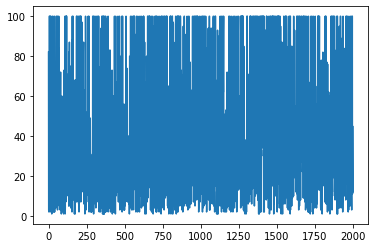

In [15]:
plt.plot(steps)

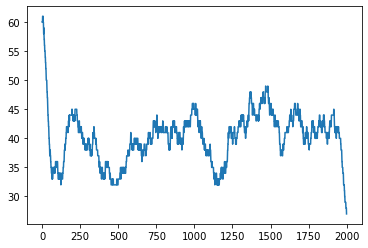

In [16]:
from scipy.ndimage import uniform_filter1d
smoothed_steps = uniform_filter1d(steps,size=100,mode='nearest')
plt.plot(smoothed_steps)